In [ ]:
!pip install --upgrade pip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install pytorch_metric_learning
!pip install faiss-gpu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 5.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.5/85.5 MB 1.9 MB/s eta 0:00:00


In [ ]:
import argparse
import numpy as np
from matplotlib import pyplot as plt
from torchvision import datasets
import torchvision.transforms as transforms
import torch
from torchvision import models
from torch.utils.data import DataLoader
from pytorch_metric_learning.utils import common_functions as c_f

from PIL import Image

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from pytorch_metric_learning import distances, losses, miners, reducers, testers, samplers
from pytorch_metric_learning.utils.accuracy_calculator import AccuracyCalculator
import faiss

# Data preprocess

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = "/content/drive/MyDrive/CV2/dataset"

Train: Dataset ImageFolder
    Number of datapoints: 1071
    Root location: /content/drive/MyDrive/CV2/dataset/train
    StandardTransform
Transform: Compose(
               Resize(size=224, interpolation=bilinear, max_size=None, antialias=warn)
               CenterCrop(size=(224, 224))
               ToTensor()
           )
 Validation: Dataset ImageFolder
    Number of datapoints: 135
    Root location: /content/drive/MyDrive/CV2/dataset/valid
    StandardTransform
Transform: Compose(
               Resize(size=224, interpolation=bilinear, max_size=None, antialias=warn)
               CenterCrop(size=(224, 224))
               ToTensor()
           )
 Test: Dataset ImageFolder
    Number of datapoints: 56
    Root location: /content/drive/MyDrive/CV2/dataset/test
    StandardTransform
Transform: Compose(
               Resize(size=224, interpolation=bilinear, max_size=None, antialias=warn)
               CenterCrop(size=(224, 224))
               ToTensor()
           )

Labels: ['

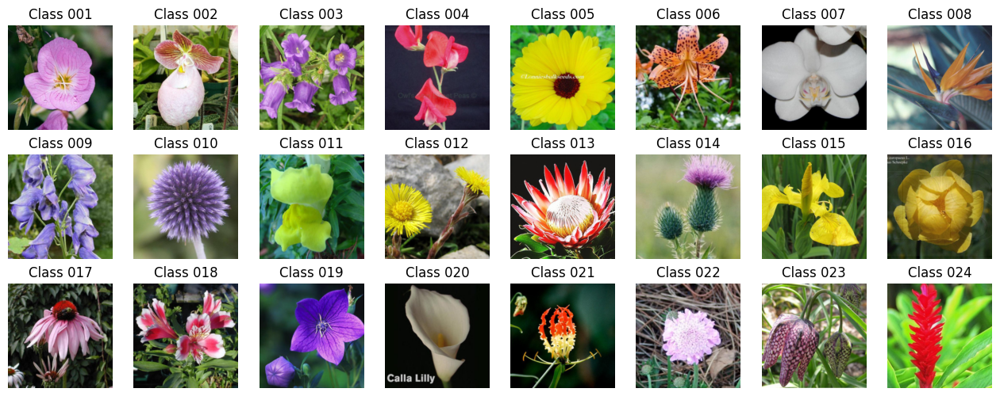

In [ ]:
def show_samples(dataset):

    labels_to_indices = c_f.get_labels_to_indices(dataset.targets)
    indexes = [labels_to_indices[i] for i in np.arange(0,24)]

    cols, rows = 8, 3
    figure = plt.figure(figsize=(cols*2, rows*2))

    for i in range(0, cols * rows):
        sample, label = dataset[indexes[i][0]]
        figure.add_subplot(rows, cols, i+1)
        plt.title(f'Class {dataset.classes[label]}')
        plt.axis("off")
        plt.imshow(sample.permute(1, 2, 0), cmap="gray")
    plt.show()


if __name__ == '__main__':
    #parser = argparse.ArgumentParser()
    #parser.add_argument('--dataPath', type=str, default=path)

    #parser.add_argument(path, type=str)

    #args = parser.parse_args()

    transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop((224, 224)),
    transforms.ToTensor()])

    """dataset_train = datasets.ImageFolder(root=f'{args.dataPath}/train', transform=transform)
    dataset_valid = datasets.ImageFolder(root=f'{args.dataPath}/valid', transform=transform)
    dataset_test = datasets.ImageFolder(root=f'{args.dataPath}/test', transform=transform)"""

    dataset_train = datasets.ImageFolder(root=f'{path}/train', transform=transform)
    dataset_valid = datasets.ImageFolder(root=f'{path}/valid', transform=transform)
    dataset_test = datasets.ImageFolder(root=f'{path}/test', transform=transform)

    print(f'Train: {dataset_train}\n', f'Validation: {dataset_valid}\n', f'Test: {dataset_test}\n')

    # Display labels and samples
    print(f"Labels: {dataset_train.classes}")
    show_samples(dataset_train)

# General functions

In [ ]:
def get_similarity_scores(query_images, dataset_train, resnet18, device):
    # Extract the embeddings from the candidate images (reference set), storing them in a matrix
    candidate_embeddings = []
    for candidate_image, _ in dataset_train:
        candidate_image = candidate_image.unsqueeze(0)
        candidate_image = candidate_image.to(device)

        with torch.no_grad():
            # Compute the embeddings
            outputs = resnet18(candidate_image)
            candidate_embeddings.append(outputs[0].cpu().numpy())
    candidate_embeddings = np.stack(candidate_embeddings)

    all_similarity_scores = []
    all_query_embeddings = []
    for query_image in query_images:
        # Take a query image and extract its embeddings
        query_image = query_image.unsqueeze(0)
        query_image = query_image.to(device)
        with torch.no_grad():
            outputs = resnet18(query_image)
            #query_embedding = outputs[0].numpy()
            query_embedding = outputs[0].cpu().numpy()
        all_query_embeddings.append(query_embedding)

        # Iterate over the embedding matrix (computed in step 1) and compute the similarity score between the query embedding and the current candidate embeddings
        similarity_scores = []
        for candidate_embedding in candidate_embeddings:
            similarity_score = np.dot(query_embedding, candidate_embedding) / (np.linalg.norm(query_embedding) * np.linalg.norm(candidate_embedding))
            similarity_scores.append(similarity_score)

        all_similarity_scores.append(similarity_scores)

    return all_similarity_scores, all_query_embeddings, candidate_embeddings


In [ ]:
def get_sample_tuples(dataset, num_tuples):
    data_iter = iter(dataset)
    sample_tuples = []
    for i in range(num_tuples):
        sample1 = next(data_iter)
        sample2 = next(data_iter)
        sample_tuples.append((sample1, sample2))
    return sample_tuples

def compare_samples(sample1, sample2, model):

    # Make predictions on the samples using the model
    with torch.no_grad():
        sample1_pred = model(sample1[0].unsqueeze(0).to('cuda')).argmax(dim=1).item()
        sample2_pred = model(sample2[0].unsqueeze(0).to('cuda')).argmax(dim=1).item()

    # Display the first sample image
    plt.subplot(1, 2, 1)
    sample1_image = sample1[0].permute(1, 2, 0).cpu().numpy()
    plt.imshow(sample1_image)
    plt.title(f'Sample 1\nTrue Class: {sample1[1]}\nPredicted Class: {sample1_pred}')
    plt.axis('off')

    # Display the second sample image
    plt.subplot(1, 2, 2)
    sample2_image = sample2[0].permute(1, 2, 0).cpu().numpy()
    plt.imshow(sample2_image)
    #plt.title(f'Sample 2\nTrue Class: {sample2[1]}')
    plt.title(f'Sample 2\nTrue Class: {sample2[1]}\nPredicted Class: {sample2_pred}')
    plt.axis('off')




   # Compare the predicted class labels of the two samples
    if sample1_pred == sample2_pred:
        print("The model predicts that the samples belong to the same class.")
        same_class_model = True
    else:
        print("The model predicts that the samples do not belong to the same class.")
        same_class_model = False


    if sample1[1] == sample2[1]:
        print("The samples belong to the same class.")
        same_class = True
    else:
        print("The samples do not belong to the same class.")
        same_class = False

    # Show the plot
    plt.show()

    return same_class_model, same_class

def calculate_accuracy(sample_tuples, model):
    num_correct = 0
    for sample1, sample2 in sample_tuples:
        same_class_model, same_class = compare_samples(sample1, sample2, model)
        if same_class_model == same_class:
            num_correct += 1
    accuracy = num_correct / len(sample_tuples)
    return accuracy

# Samples

In [ ]:
test_data_iter = iter(dataset_test)
query_images = []
query_labels = []
selected_labels = set()
while len(query_images) < 5:
    query_image, query_label = next(test_data_iter)
    if query_label not in selected_labels:
        query_image = query_image.to('cuda')
        query_images.append(query_image)
        query_labels.append(query_label)
        selected_labels.add(query_label)



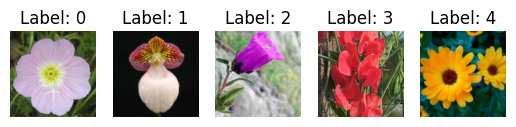

In [ ]:
for i, (query_image, query_label) in enumerate(zip(query_images, query_labels)):
    query_image = query_image.squeeze(0).permute(1, 2, 0).cpu().numpy()

    # Display the image
    plt.subplot(1, 5, i+1)
    plt.imshow(query_image)
    plt.title(f'Label: {query_label}')
    plt.axis('off')

plt.show()


# Task 1

## Load pre-trained model

In [ ]:
if torch.cuda.is_available():
    device_name = "cuda"
elif torch.backends.mps.is_available():
    device_name = "mps"
else:
    device_name = "cpu"

device = torch.device(device_name)
print(f"Code runs in {device}")

resnet18 = models.resnet18(pretrained=True)
resnet18.fc = nn.Linear(512, 24)
resnet18.to(device)
resnet18.eval()

Code runs in cuda


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

## Finding the k most similar images

In [ ]:
all_similarity_scores, all_query_embeddings, reference_set_embeddings = get_similarity_scores(query_images, dataset_train, resnet18, device)

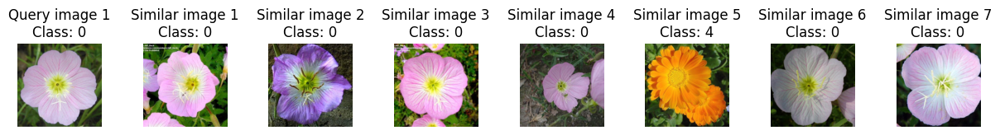

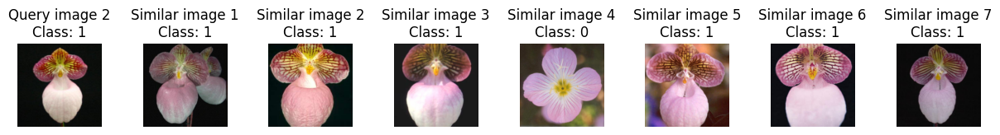

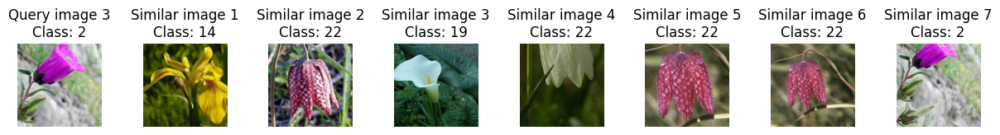

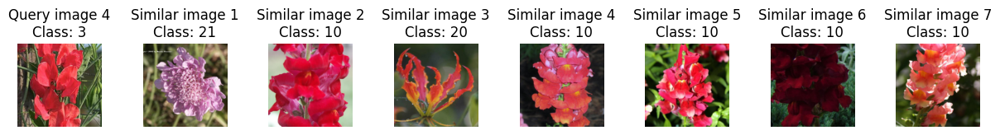

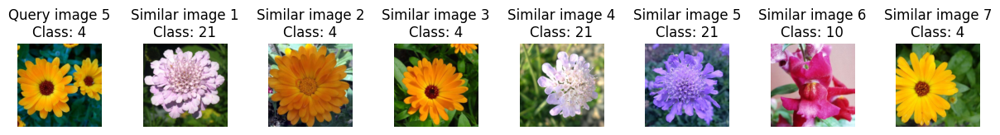

In [ ]:
k = 7  # Number of most similar images to retrieve

# Get the k most similar images for each query image
for i, (similarity_scores, query_label) in enumerate(zip(all_similarity_scores, query_labels)):
    # Get the indices of the k most similar images
    most_similar_indices = np.argsort(similarity_scores)[-k:]

    # Create a new figure with a larger size
    plt.figure(figsize=(15, 3))

    # Display the query image
    plt.subplot(1, k+1, 1)
    query_image = query_images[i].permute(1, 2, 0).cpu().numpy()
    plt.imshow(query_image)
    plt.title(f'Query image {i+1}\nClass: {query_label}')
    plt.axis('off')

    # Display the k most similar images
    for j, idx in enumerate(most_similar_indices):
        reference_image, reference_label = dataset_train[idx]
        reference_image = reference_image.permute(1, 2, 0).cpu().numpy()
        plt.subplot(1, k+1, j+2)
        plt.imshow(reference_image)
        plt.title(f'Similar image {j+1}\nClass: {reference_label}')
        plt.axis('off')

    # Adjust the spacing between subplots
    plt.subplots_adjust(wspace=0.5)

plt.show()



In [ ]:
true_positives = 0
false_positives = 0
false_negatives = 0

# Get the k most similar images for each query image
for i, (similarity_scores, query_label) in enumerate(zip(all_similarity_scores, query_labels)):
    # Get the indices of the k most similar images
    most_similar_indices = np.argsort(similarity_scores)[-k:]

    # Count the number of true positives and false positives
    for idx in most_similar_indices:
        _, reference_label = dataset_train[idx]
        if reference_label == query_label:
            true_positives += 1
        else:
            false_positives += 1

    # Count the number of false negatives
    false_negatives += sum(1 for _, label in dataset_train if label == query_label) - true_positives

# Compute precision, recall and F1 score
precision = true_positives / (true_positives + false_positives)
recall = true_positives / (true_positives + false_negatives)
f1_score = 2 * (precision * recall) / (precision + recall)

print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1_score:.2f}')

Precision: 0.46
Recall: 0.10
F1 Score: 0.16


## Decide if 2 images belong to the same category

The model predicts that the samples belong to the same class.
The samples belong to the same class.


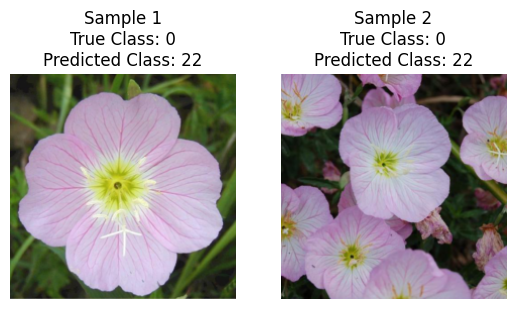

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


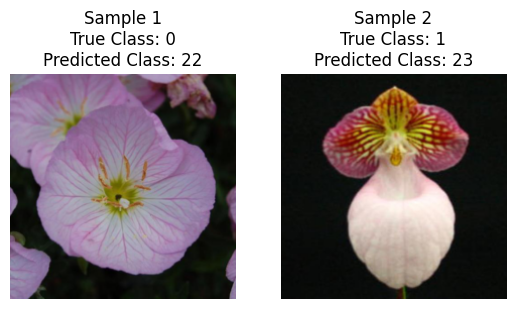

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


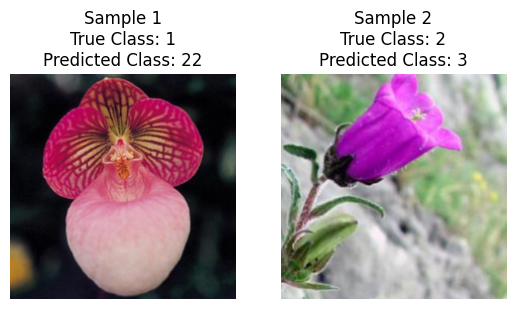

The model predicts that the samples belong to the same class.
The samples do not belong to the same class.


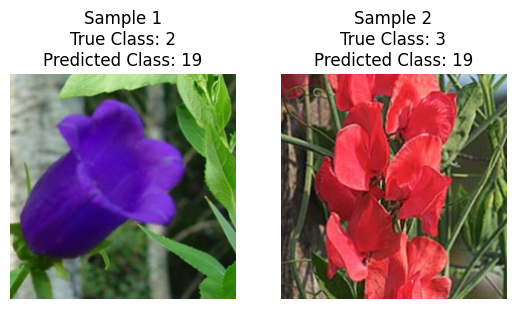

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


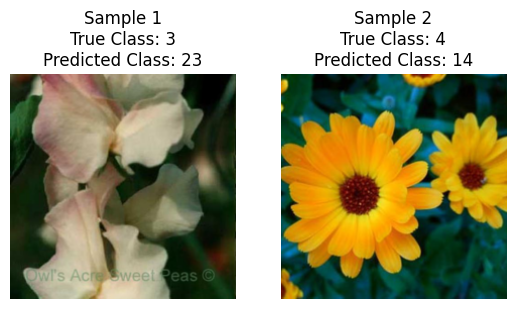

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


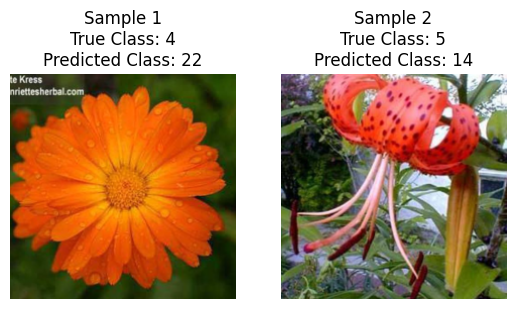

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


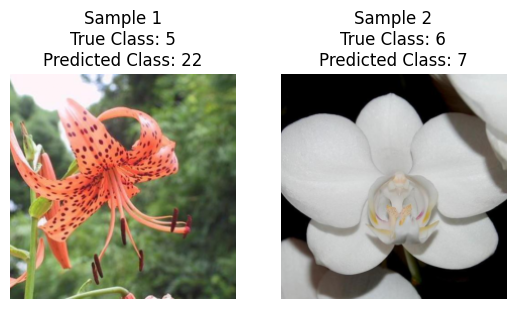

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


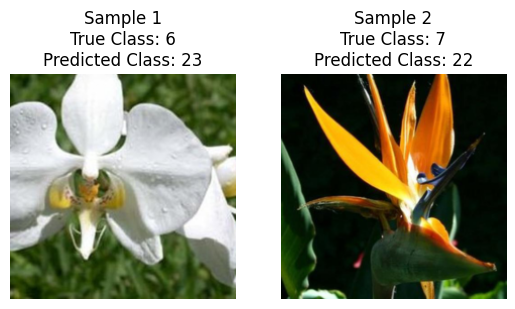

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


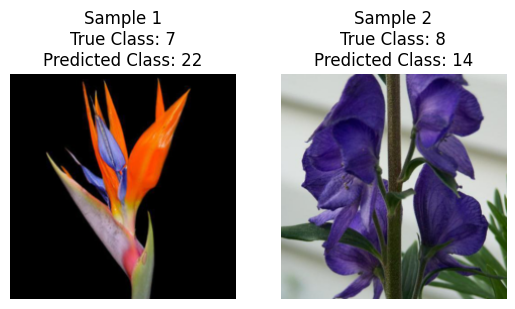

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


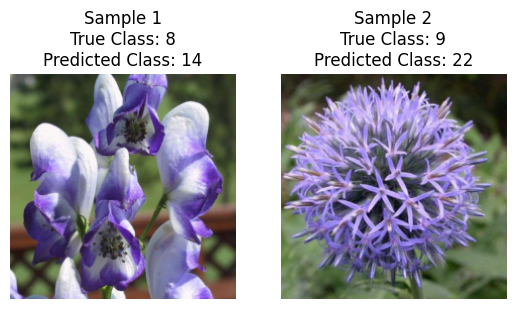

The model predicts that the samples belong to the same class.
The samples do not belong to the same class.


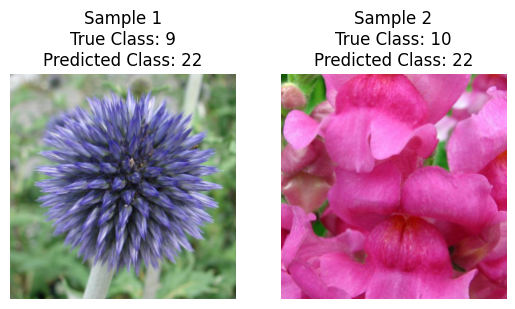

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


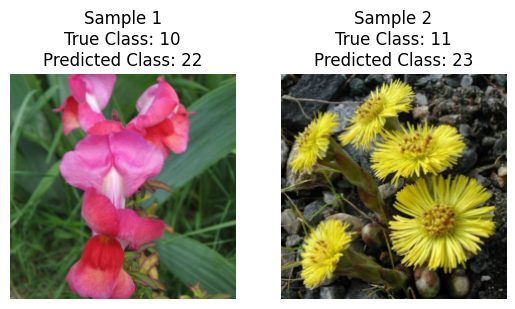

The model predicts that the samples do not belong to the same class.
The samples belong to the same class.


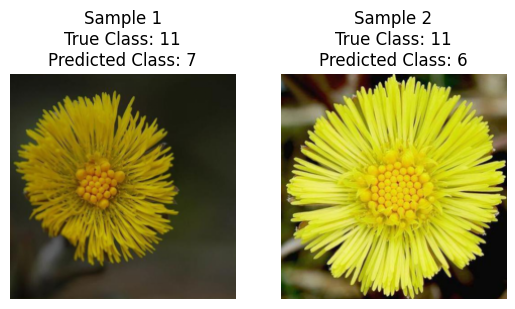

The model predicts that the samples belong to the same class.
The samples belong to the same class.


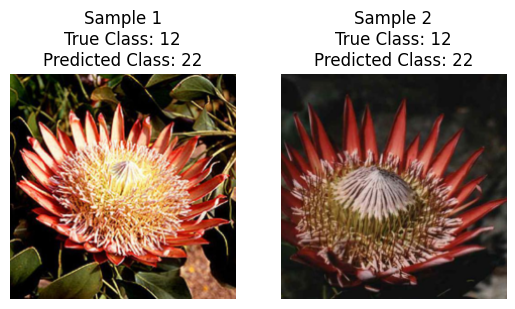

The model predicts that the samples belong to the same class.
The samples do not belong to the same class.


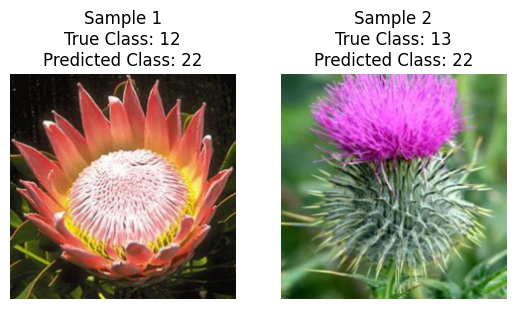

The model predicts that the samples do not belong to the same class.
The samples belong to the same class.


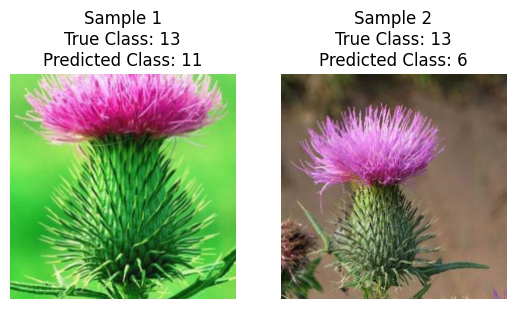

The model predicts that the samples belong to the same class.
The samples belong to the same class.


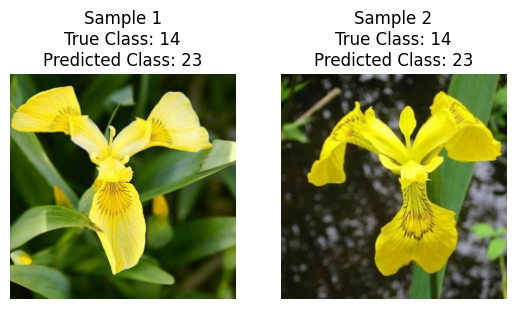

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


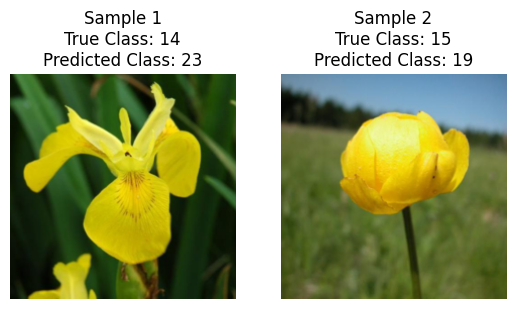

The model predicts that the samples belong to the same class.
The samples belong to the same class.


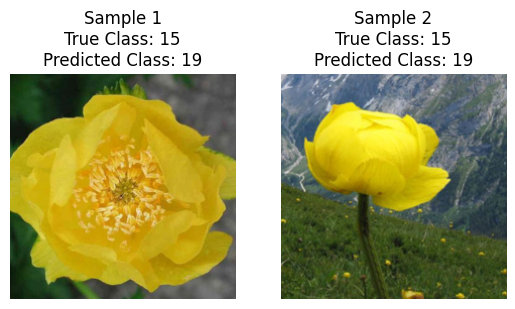

The model predicts that the samples do not belong to the same class.
The samples belong to the same class.


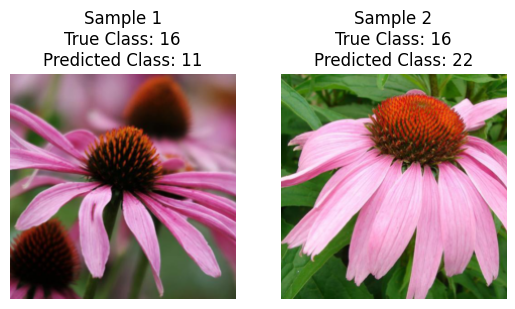

Accuracy: 0.70


In [ ]:
sample_tuples = get_sample_tuples(dataset_test, 20)

# Calculate the accuracy of the binary classifier
accuracy = calculate_accuracy(sample_tuples, resnet18)

# Print the accuracy
print(f'Accuracy: {accuracy:.2f}')

# Task 2

## Task 2 functions

In [ ]:
def train(model, loss_func, mining_func, device, train_loader, optimizer, epoch):
    model.train()
    for batch_idx, (data, labels) in enumerate(train_loader):
        data, labels = data.to(device), labels.to(device)
        optimizer.zero_grad()
        embeddings = model(data)
        indices_tuple = mining_func(embeddings, labels)
        loss = loss_func(embeddings, labels, indices_tuple)
        loss.backward()
        optimizer.step()
        if batch_idx % 20 == 0:
            print(
                "Epoch {} Iteration {}: Loss = {}, Number of mined triplets = {}".format(
                    epoch, batch_idx, loss, mining_func.num_triplets
                )
            )
def get_all_embeddings(dataset, model):
    tester = testers.BaseTester()
    return tester.get_all_embeddings(dataset, model)

def test(train_set, test_set, model, accuracy_calculator):
    train_embeddings, train_labels = get_all_embeddings(train_set, model)
    test_embeddings, test_labels = get_all_embeddings(test_set, model)
    train_labels = train_labels.squeeze(1)
    test_labels = test_labels.squeeze(1)
    print("Computing accuracy")
    accuracies = accuracy_calculator.get_accuracy(
        test_embeddings, test_labels, train_embeddings, train_labels, False
    )
    print("Test set accuracy (Precision@1) = {}".format(accuracies["precision_at_1"]))

In [ ]:
# Sampler
class PKSampler(torch.utils.data.Sampler):
    def __init__(self, data_source, P, K):
        self.data_source = data_source
        self.P = P
        self.K = K
        self.labels = np.array([label for _, label in data_source])
        self.labels_set = list(set(self.labels))

    def __iter__(self):
        indices = []
        for _ in range(len(self)):
            selected_labels = np.random.choice(self.labels_set, size=self.P, replace=False)
            for label in selected_labels:
                label_indices = np.where(self.labels == label)[0]
                selected_indices = np.random.choice(label_indices, size=self.K, replace=False)
                indices.extend(selected_indices)
        return iter(indices)

    def __len__(self):
        return len(self.data_source) // (self.P * self.K)

## Semihard mining

### Train model

In [ ]:
torch.cuda.empty_cache()

In [ ]:
if torch.cuda.is_available():
    device_name = "cuda"
elif torch.backends.mps.is_available():
    device_name = "mps"
else:
    device_name = "cpu"

device = torch.device(device_name)
print(f"Code runs in {device}")

model = models.resnet18(pretrained=True)
model.fc = nn.Linear(512, 24)
model.to(device)

model.train()

Code runs in cuda


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
distance = distances.CosineSimilarity()
reducer = reducers.ThresholdReducer(low=0)
loss_func = losses.TripletMarginLoss(margin=0.2, distance=distance, reducer=reducer)
mining_func = miners.TripletMarginMiner(
    margin=0.2, distance=distance, type_of_triplets="semihard"
)
accuracy_calculator = AccuracyCalculator(include=("precision_at_1",), k=1)


P = 24 # Number of categories to sample from
K = 20 # Number of samples to select from each category

train_sampler = PKSampler(dataset_train, P, K)
train_loader = DataLoader(dataset_train, batch_size=P*K, sampler=train_sampler)

In [ ]:
num_epochs = 10
optimizer = optim.Adam(model.parameters(), lr=0.001)
for epoch in range(1, num_epochs + 1):
    train(model, loss_func, mining_func, device, train_loader, optimizer, epoch)
    test(dataset_train, dataset_valid, model, accuracy_calculator)

Epoch 1 Iteration 0: Loss = 0.07984505593776703, Number of mined triplets = 10308


100%|██████████| 5/5 [00:01<00:00,  4.14it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.8814814814814815
Epoch 2 Iteration 0: Loss = 0.06680435687303543, Number of mined triplets = 6551


100%|██████████| 5/5 [00:01<00:00,  4.03it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.9037037037037038
Epoch 3 Iteration 0: Loss = 0.04777286574244499, Number of mined triplets = 4453


100%|██████████| 5/5 [00:01<00:00,  4.07it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.9111111111111111
Epoch 4 Iteration 0: Loss = 0.06982126832008362, Number of mined triplets = 6856


100%|██████████| 5/5 [00:01<00:00,  4.04it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.9333333333333333
Epoch 5 Iteration 0: Loss = 0.06284330785274506, Number of mined triplets = 2753


100%|██████████| 5/5 [00:01<00:00,  3.98it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.9555555555555556
Epoch 6 Iteration 0: Loss = 0.07387356460094452, Number of mined triplets = 4500


100%|██████████| 5/5 [00:01<00:00,  4.06it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.9777777777777779
Epoch 7 Iteration 0: Loss = 0.06772471219301224, Number of mined triplets = 4754


100%|██████████| 5/5 [00:01<00:00,  3.88it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.9407407407407408
Epoch 8 Iteration 0: Loss = 0.03568241372704506, Number of mined triplets = 508


100%|██████████| 5/5 [00:01<00:00,  3.71it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.9407407407407408
Epoch 9 Iteration 0: Loss = 0.059307537972927094, Number of mined triplets = 1552


100%|██████████| 5/5 [00:01<00:00,  4.02it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.8592592592592593
Epoch 10 Iteration 0: Loss = 0.06635331362485886, Number of mined triplets = 2942


100%|██████████| 5/5 [00:01<00:00,  4.01it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.8962962962962964


### Finding the k most similar images

In [ ]:
all_similarity_scores, all_query_embeddings, reference_set_embeddings = get_similarity_scores(query_images, dataset_train, model, device)

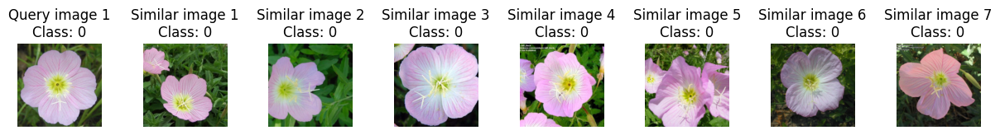

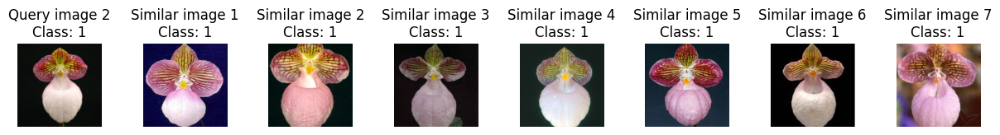

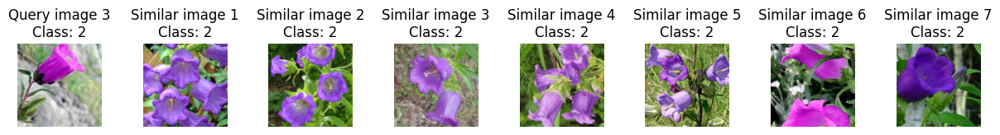

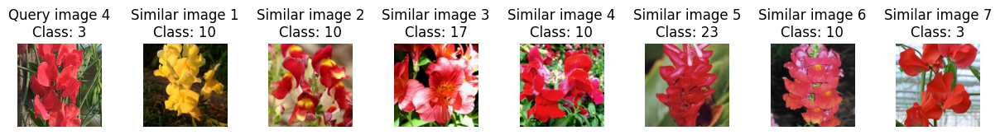

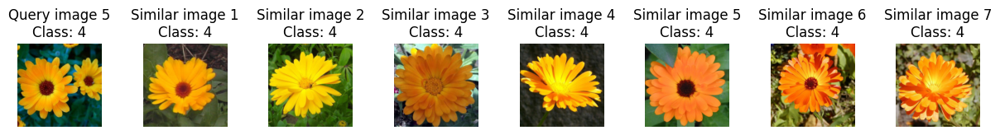

In [ ]:
k = 7  # Number of most similar images to retrieve

# Get the k most similar images for each query image
for i, (similarity_scores, query_label) in enumerate(zip(all_similarity_scores, query_labels)):
    # Get the indices of the k most similar images
    most_similar_indices = np.argsort(similarity_scores)[-k:]

    # Create a new figure with a larger size
    plt.figure(figsize=(15, 3))

    # Display the query image
    plt.subplot(1, k+1, 1)
    query_image = query_images[i].permute(1, 2, 0).cpu().numpy()
    plt.imshow(query_image)
    plt.title(f'Query image {i+1}\nClass: {query_label}')
    plt.axis('off')

    # Display the k most similar images
    for j, idx in enumerate(most_similar_indices):
        reference_image, reference_label = dataset_train[idx]
        reference_image = reference_image.permute(1, 2, 0).cpu().numpy()
        plt.subplot(1, k+1, j+2)
        plt.imshow(reference_image)
        plt.title(f'Similar image {j+1}\nClass: {reference_label}')
        plt.axis('off')

    # Adjust the spacing between subplots
    plt.subplots_adjust(wspace=0.5)

plt.show()

In [ ]:
true_positives = 0
false_positives = 0
false_negatives = 0

# Get the k most similar images for each query image
for i, (similarity_scores, query_label) in enumerate(zip(all_similarity_scores, query_labels)):
    # Get the indices of the k most similar images
    most_similar_indices = np.argsort(similarity_scores)[-k:]

    # Count the number of true positives and false positives
    for idx in most_similar_indices:
        _, reference_label = dataset_train[idx]
        if reference_label == query_label:
            true_positives += 1
        else:
            false_positives += 1

    # Count the number of false negatives
    false_negatives += sum(1 for _, label in dataset_train if label == query_label) - true_positives

# Compute precision, recall and F1 score
precision = true_positives / (true_positives + false_positives)
recall = true_positives / (true_positives + false_negatives)
f1_score = 2 * (precision * recall) / (precision + recall)

print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1_score:.2f}')

Precision: 0.83
Recall: 0.21
F1 Score: 0.33


### Decide if 2 images belong to the same category

The model predicts that the samples belong to the same class.
The samples belong to the same class.


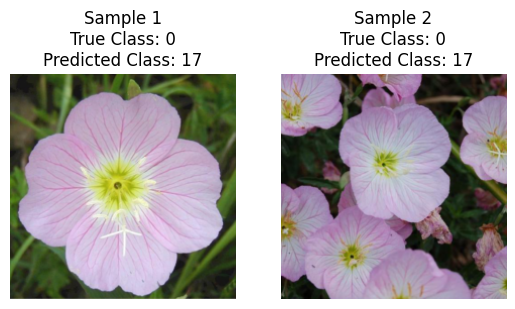

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


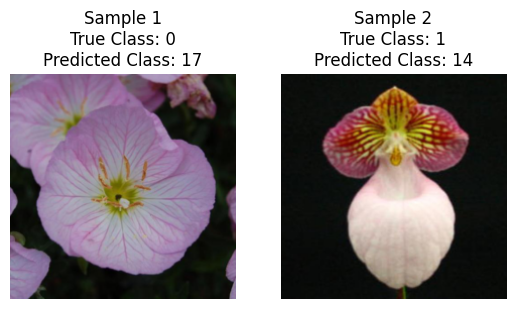

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


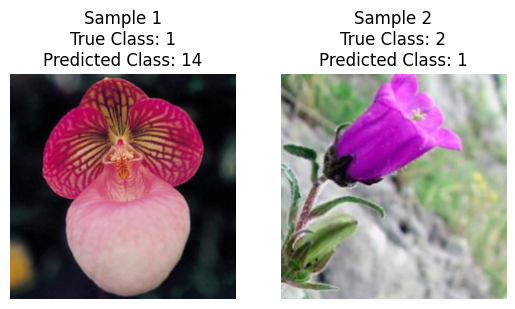

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


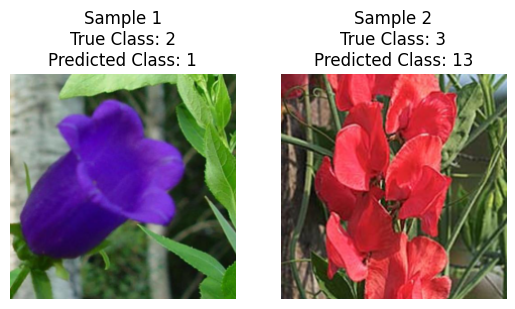

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


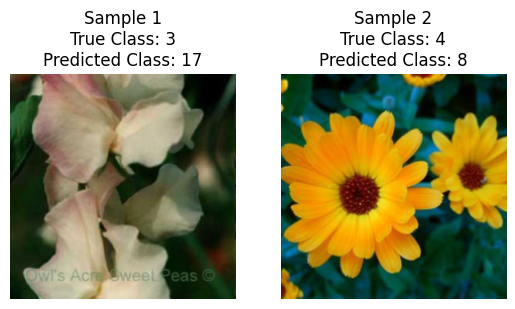

The model predicts that the samples belong to the same class.
The samples do not belong to the same class.


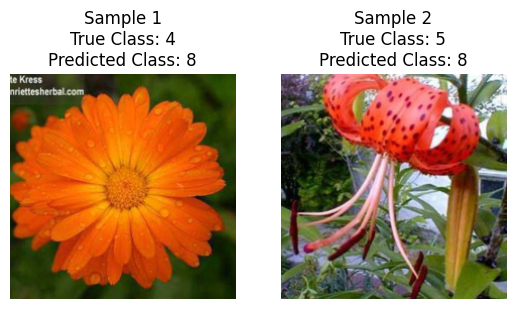

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


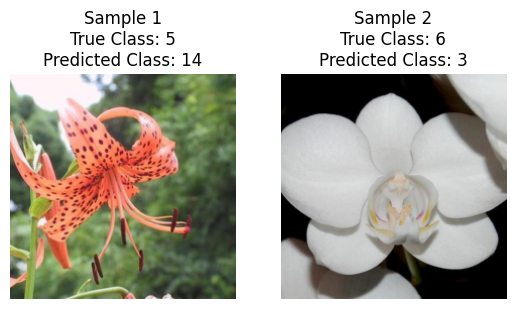

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


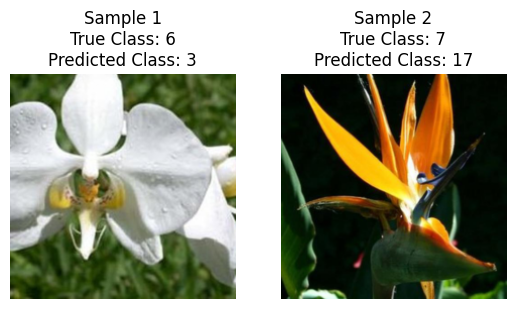

The model predicts that the samples belong to the same class.
The samples do not belong to the same class.


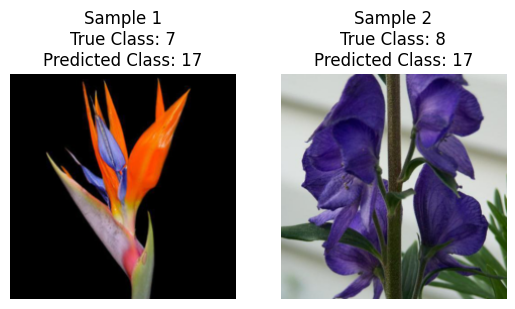

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


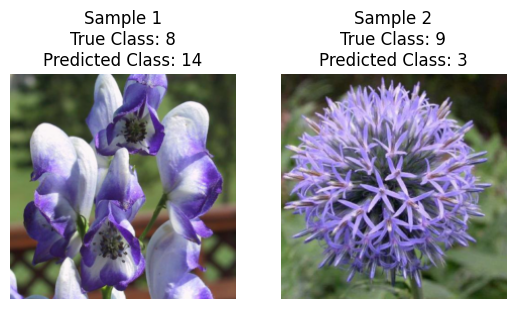

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


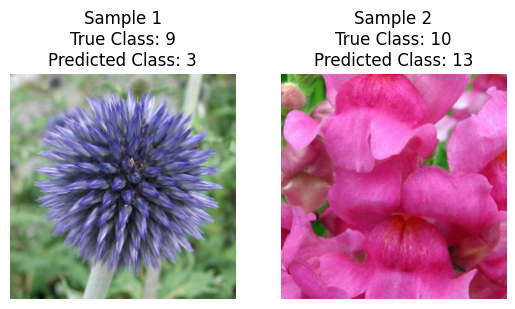

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


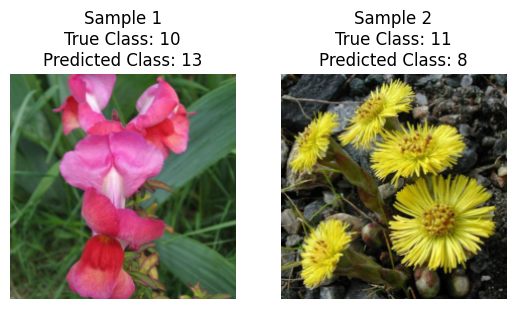

The model predicts that the samples belong to the same class.
The samples belong to the same class.


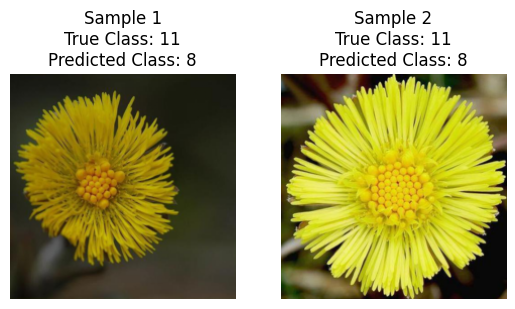

The model predicts that the samples do not belong to the same class.
The samples belong to the same class.


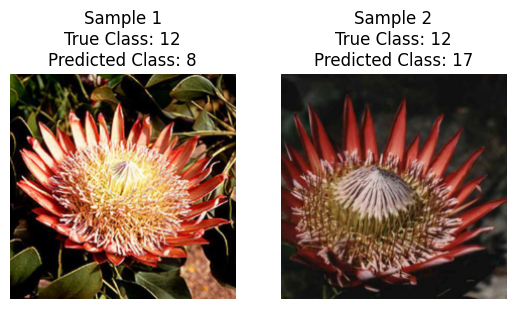

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


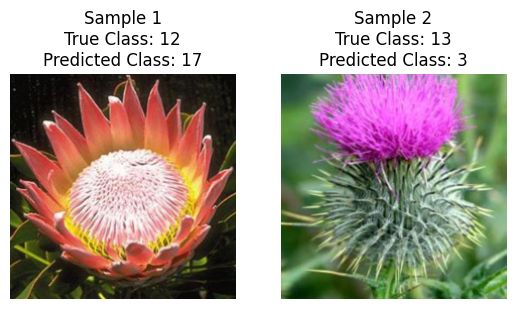

The model predicts that the samples belong to the same class.
The samples belong to the same class.


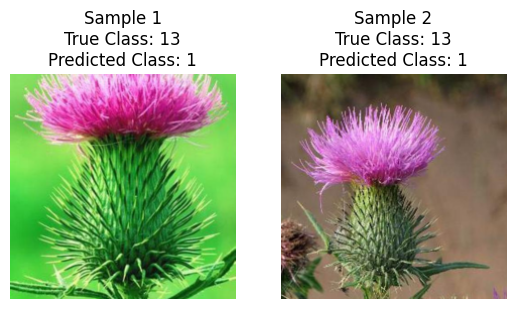

The model predicts that the samples belong to the same class.
The samples belong to the same class.


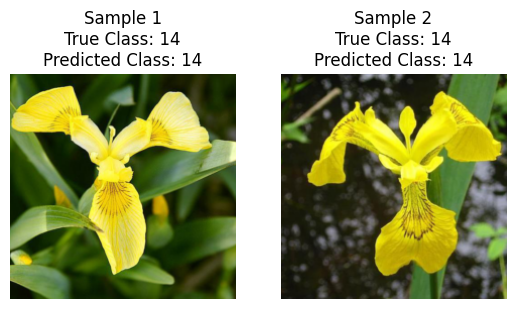

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


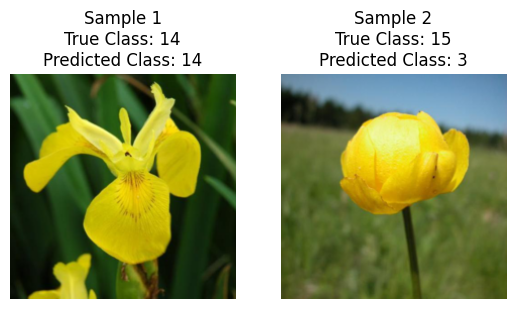

The model predicts that the samples do not belong to the same class.
The samples belong to the same class.


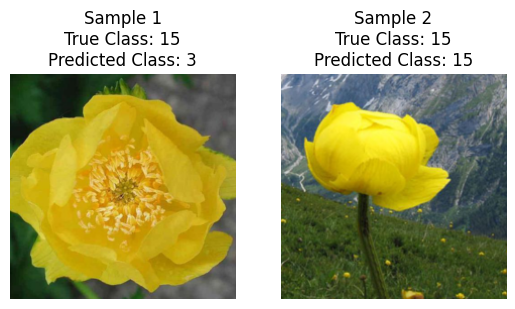

The model predicts that the samples do not belong to the same class.
The samples belong to the same class.


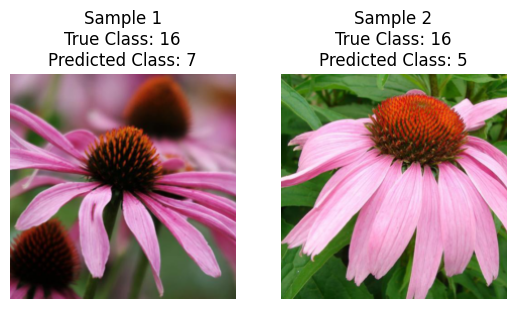

Accuracy: 0.75


In [ ]:
sample_tuples = get_sample_tuples(dataset_test, 20)


accuracy = calculate_accuracy(sample_tuples, model)

# Print the accuracy
print(f'Accuracy: {accuracy:.2f}')

## Hard

### Train model

In [ ]:
torch.cuda.empty_cache()

In [ ]:


if torch.cuda.is_available():
    device_name = "cuda"
elif torch.backends.mps.is_available():
    device_name = "mps"
else:
    device_name = "cpu"

device = torch.device(device_name)
print(f"Code runs in {device}")

model = models.resnet18(pretrained=True)
model.fc = nn.Linear(512, 24)
model.to(device)

model.train()

Code runs in cuda


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
distance = distances.CosineSimilarity()
reducer = reducers.ThresholdReducer(low=0)
loss_func = losses.TripletMarginLoss(margin=0.2, distance=distance, reducer=reducer)
mining_func = miners.TripletMarginMiner(
    margin=0.2, distance=distance, type_of_triplets="hard"
)
accuracy_calculator = AccuracyCalculator(include=("precision_at_1",), k=1)


P = 23 # Number of categories to sample from
K = 20 # Number of samples to select from each category

train_sampler = PKSampler(dataset_train, P, K)
train_loader = DataLoader(dataset_train, batch_size=P*K, sampler=train_sampler)

In [ ]:
num_epochs = 10
for epoch in range(1, num_epochs + 1):
    train(model, loss_func, mining_func, device, train_loader, optimizer, epoch)
    test(dataset_train, dataset_valid, model, accuracy_calculator)

Epoch 1 Iteration 0: Loss = 0.29525020718574524, Number of mined triplets = 836090


100%|██████████| 5/5 [00:01<00:00,  4.04it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.6370370370370371
Epoch 2 Iteration 0: Loss = 0.2916528880596161, Number of mined triplets = 799776


100%|██████████| 5/5 [00:02<00:00,  2.23it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.6
Epoch 3 Iteration 0: Loss = 0.29337313771247864, Number of mined triplets = 782314


100%|██████████| 5/5 [00:01<00:00,  3.99it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.6074074074074074
Epoch 4 Iteration 0: Loss = 0.2939007878303528, Number of mined triplets = 805867


100%|██████████| 5/5 [00:01<00:00,  3.81it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.6222222222222222
Epoch 5 Iteration 0: Loss = 0.2903967499732971, Number of mined triplets = 781291


100%|██████████| 5/5 [00:02<00:00,  2.50it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.5777777777777778
Epoch 6 Iteration 0: Loss = 0.29375195503234863, Number of mined triplets = 784996


100%|██████████| 5/5 [00:01<00:00,  3.95it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.6148148148148148
Epoch 7 Iteration 0: Loss = 0.2944287061691284, Number of mined triplets = 799097


100%|██████████| 5/5 [00:01<00:00,  4.05it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.6
Epoch 8 Iteration 0: Loss = 0.29656901955604553, Number of mined triplets = 831729


100%|██████████| 5/5 [00:01<00:00,  3.55it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.5555555555555556
Epoch 9 Iteration 0: Loss = 0.29450270533561707, Number of mined triplets = 828036


100%|██████████| 5/5 [00:01<00:00,  4.02it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.5703703703703704
Epoch 10 Iteration 0: Loss = 0.29603251814842224, Number of mined triplets = 803077


100%|██████████| 5/5 [00:01<00:00,  4.06it/s]


Computing accuracy
Test set accuracy (Precision@1) = 0.5703703703703704


In [ ]:
test(dataset_train, dataset_test, model, accuracy_calculator)

100%|██████████| 2/2 [00:05<00:00,  2.53s/it]


Computing accuracy
Test set accuracy (Precision@1) = 0.6785714285714285


### Finding the k most similar images

In [ ]:
all_similarity_scores, all_query_embeddings, reference_set_embeddings = get_similarity_scores(query_images, dataset_train, model, device)

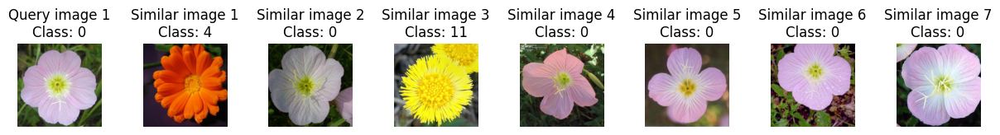

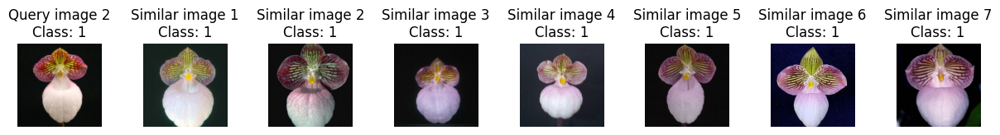

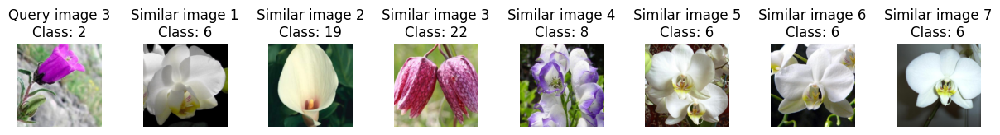

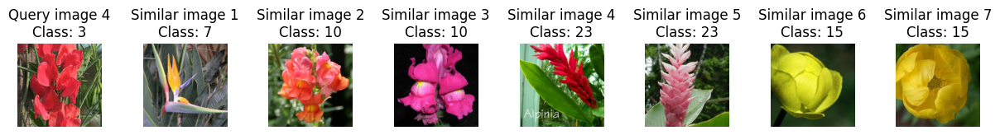

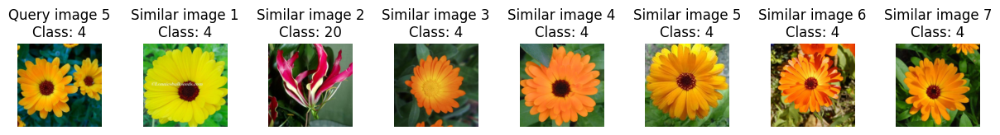

In [ ]:
k = 7  # Number of most similar images to retrieve

# Get the k most similar images for each query image
for i, (similarity_scores, query_label) in enumerate(zip(all_similarity_scores, query_labels)):
    # Get the indices of the k most similar images
    most_similar_indices = np.argsort(similarity_scores)[-k:]

    # Create a new figure with a larger size
    plt.figure(figsize=(15, 3))

    # Display the query image
    plt.subplot(1, k+1, 1)
    query_image = query_images[i].permute(1, 2, 0).cpu().numpy()
    plt.imshow(query_image)
    plt.title(f'Query image {i+1}\nClass: {query_label}')
    plt.axis('off')

    # Display the k most similar images
    for j, idx in enumerate(most_similar_indices):
        reference_image, reference_label = dataset_train[idx]
        reference_image = reference_image.permute(1, 2, 0).cpu().numpy()
        plt.subplot(1, k+1, j+2)
        plt.imshow(reference_image)
        plt.title(f'Similar image {j+1}\nClass: {reference_label}')
        plt.axis('off')

    # Adjust the spacing between subplots
    plt.subplots_adjust(wspace=0.5)

plt.show()

In [ ]:
true_positives = 0
false_positives = 0
false_negatives = 0

# Get the k most similar images for each query image
for i, (similarity_scores, query_label) in enumerate(zip(all_similarity_scores, query_labels)):
    # Get the indices of the k most similar images
    most_similar_indices = np.argsort(similarity_scores)[-k:]

    # Count the number of true positives and false positives
    for idx in most_similar_indices:
        _, reference_label = dataset_train[idx]
        if reference_label == query_label:
            true_positives += 1
        else:
            false_positives += 1

    # Count the number of false negatives
    false_negatives += sum(1 for _, label in dataset_train if label == query_label) - true_positives

# Compute precision, recall and F1 score
precision = true_positives / (true_positives + false_positives)
recall = true_positives / (true_positives + false_negatives)
f1_score = 2 * (precision * recall) / (precision + recall)

print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1_score:.2f}')

Precision: 0.51
Recall: 0.11
F1 Score: 0.18


### Decide if 2 images belong to the same category

The model predicts that the samples do not belong to the same class.
The samples belong to the same class.


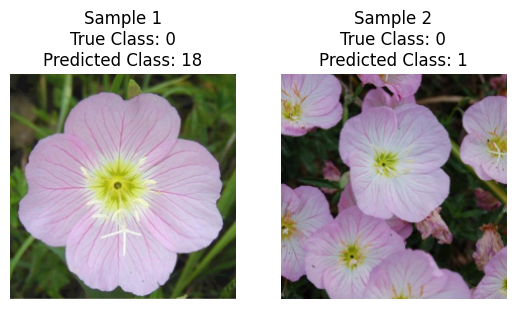

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


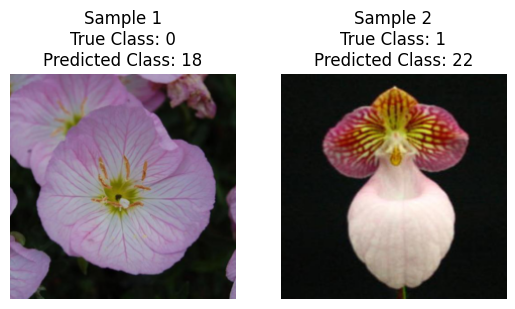

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


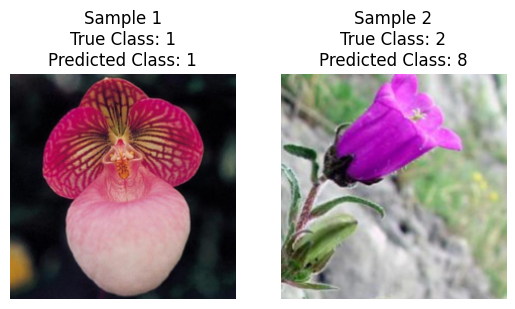

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


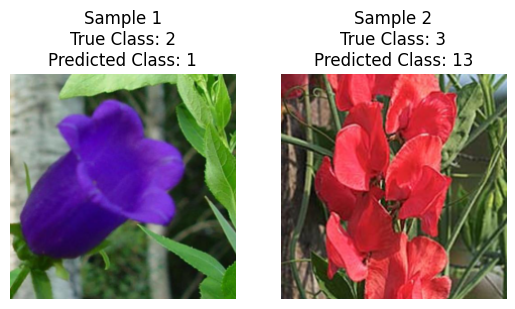

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


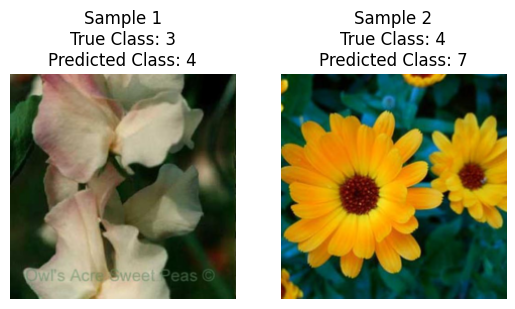

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


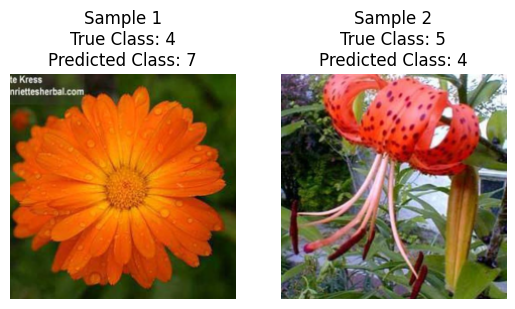

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


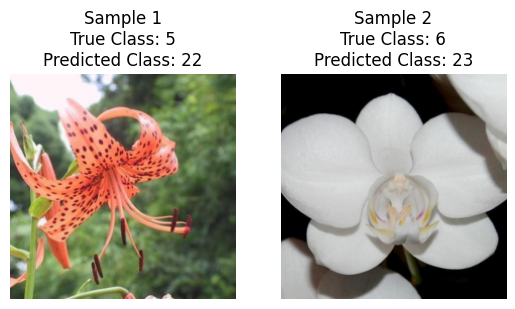

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


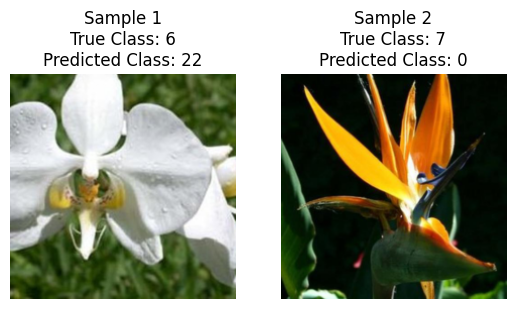

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


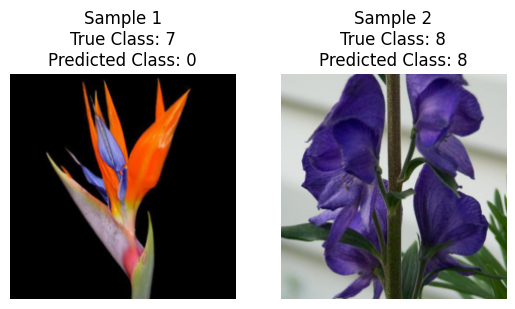

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


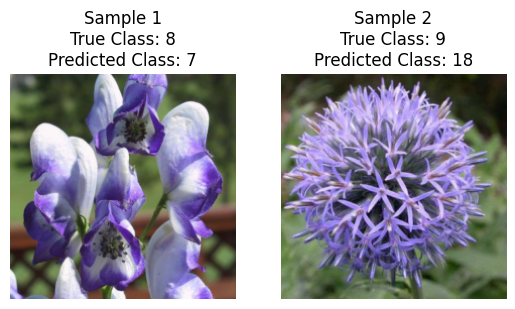

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


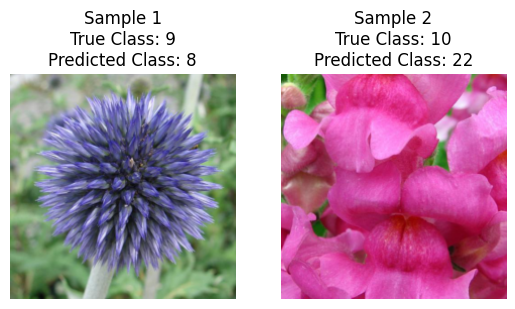

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


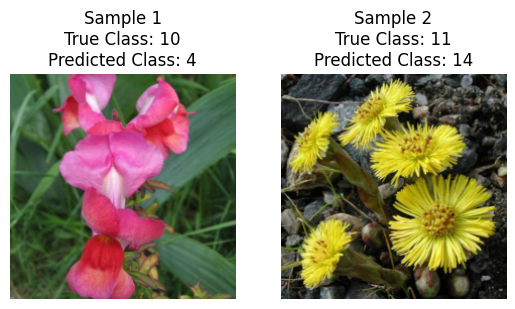

The model predicts that the samples do not belong to the same class.
The samples belong to the same class.


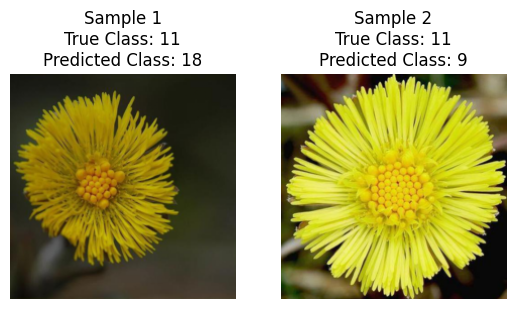

The model predicts that the samples do not belong to the same class.
The samples belong to the same class.


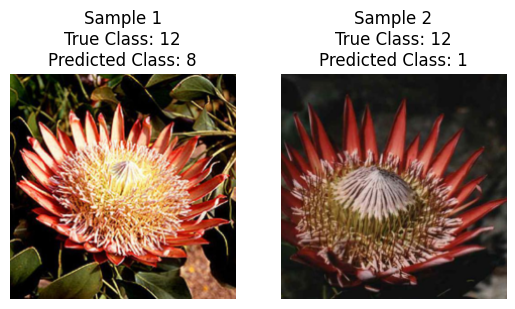

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


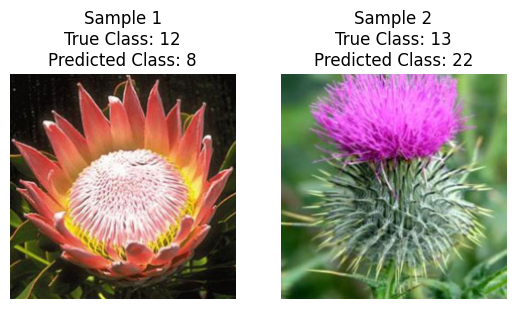

The model predicts that the samples do not belong to the same class.
The samples belong to the same class.


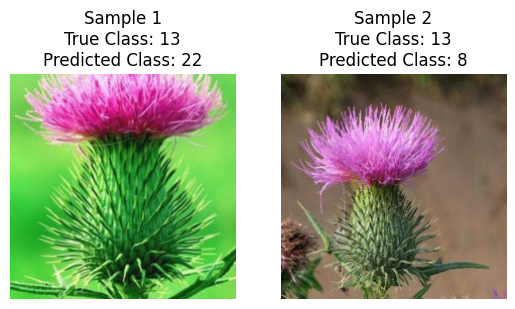

The model predicts that the samples belong to the same class.
The samples belong to the same class.


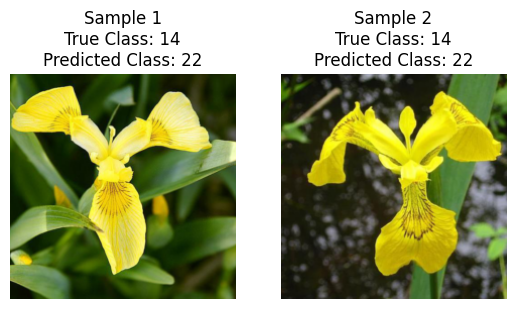

The model predicts that the samples do not belong to the same class.
The samples do not belong to the same class.


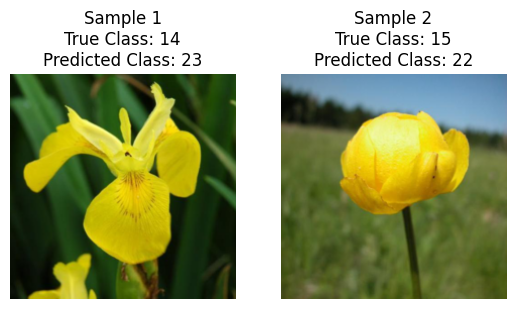

The model predicts that the samples belong to the same class.
The samples belong to the same class.


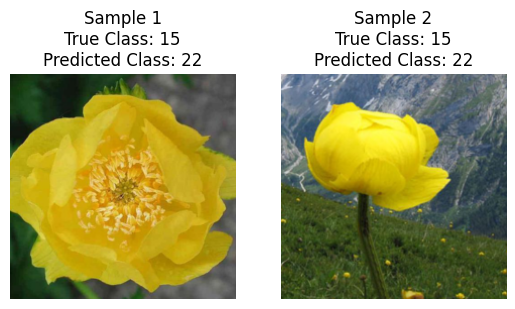

The model predicts that the samples do not belong to the same class.
The samples belong to the same class.


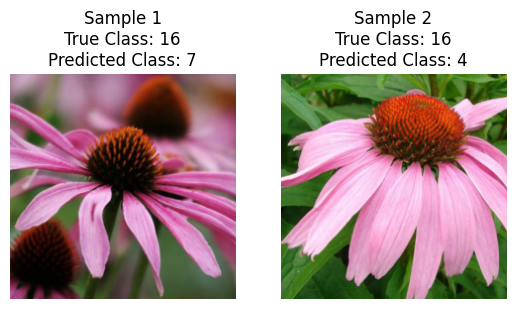

Accuracy: 0.75


In [ ]:
sample_tuples = get_sample_tuples(dataset_test, 20)


accuracy = calculate_accuracy(sample_tuples, model)

# Print the accuracy
print(f'Accuracy: {accuracy:.2f}')